In [8]:
#Importing the dependencies
import os, cv2
import numpy as np
import pandas as pd
import random, tqdm
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import torch
#torch.cuda.empty_cache()
import torch.nn as nn
from torch.utils.data import DataLoader

import albumentations as album
import segmentation_models_pytorch as smp
from sklearn.metrics import confusion_matrix

In [2]:
'''
# Directory of the dataset
dataset_path = 'G:/Major Project/Dataset/png/'
x_train = os.path.join(dataset_path, 'train')
y_train = os.path.join(dataset_path, 'train_labels')

x_val = os.path.join(dataset_path, 'val')
y_val = os.path.join(dataset_path, 'val_labels')

x_test = os.path.join(dataset_path, 'test')
y_test = os.path.join(dataset_path, 'test_labels')
'''

In [9]:
# Directory of the dataset of the PNG 
dataset_path = 'G:/Major Project/Dataset/png/'
x_train = os.path.join(dataset_path, 'train')
y_train = os.path.join(dataset_path, 'train_labels')

x_val = os.path.join(dataset_path, 'val')
y_val = os.path.join(dataset_path, 'val_labels')

x_test = os.path.join(dataset_path, 'test')
y_test = os.path.join(dataset_path, 'test_labels')

In [10]:
#Loading the Class Labels and corresponding RGB values
label_class_dict = pd.read_csv("G:/Major Project/Dataset/label_class_dict.csv")

print(type(label_class_dict),'\n')
print(label_class_dict,'\n')

# Making a list of all labels
final_label_names = label_class_dict['name'].tolist()

# Making a list of all the corresponsing rgb values
label_rgb_values = label_class_dict[['r','g','b']].values.tolist()

print('Final Labels in which the image will be segmented with their corresponding rgb values')
print('Final Class Names: ', final_label_names)
print('Label RGB Values: ', label_rgb_values)


<class 'pandas.core.frame.DataFrame'> 

         name    r    g    b
0  background    0    0    0
1    building  255  255  255 

Final Labels in which the image will be segmented with their corresponding rgb values
Final Class Names:  ['background', 'building']
Label RGB Values:  [[0, 0, 0], [255, 255, 255]]


In [11]:
#Function to visualise the training images and ground-truth masks
def load_images_from_folder(dataset_path):
    images = []
    for filename in os.listdir(dataset_path):
        img = cv2.imread(os.path.join(dataset_path,filename))
        #To handle the case when image is not able to load.
        if img is not None:
            images.append(img)
    return images
sample_images = load_images_from_folder(x_train)
sample_image_masks = load_images_from_folder(y_train)

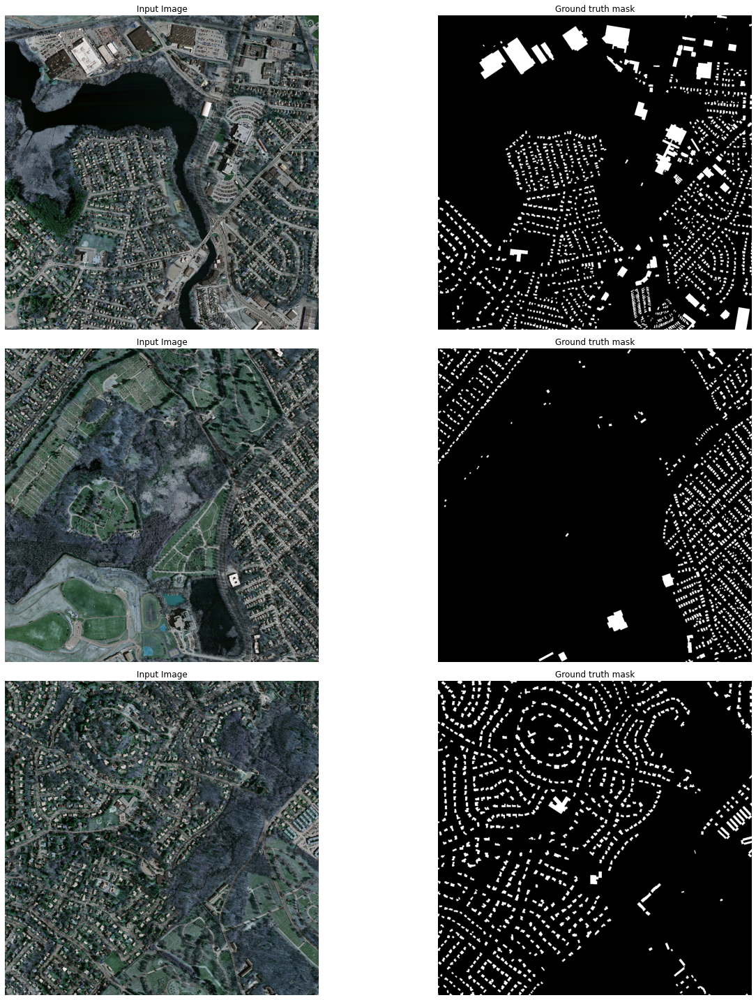

In [5]:
#Displaying the images
samples = 3
figure, ax = plt.subplots(nrows=samples, ncols=2, figsize=(20, 20))

for i in range(samples):
    ax[i, 0].imshow(sample_images[i])
    ax[i, 1].imshow(sample_image_masks[i])
    ax[i, 0].set_title("Input Image")
    ax[i, 1].set_title("Ground truth mask")
    ax[i, 0].set_axis_off()
    ax[i, 1].set_axis_off()
plt.tight_layout()
plt.show()   

In [12]:
#Function to display the Image and Encoded masks
def display_masks(**images):
    
    plt.figure(figsize=(18,9))
    for serial_num, (title, image) in enumerate(images.items()):
        plt.subplot(1, len(images), serial_num + 1)       
        plt.title(title)
        plt.imshow(image)
    plt.show()

# One hot encoding on ground truth images - (1500 1500 3) to (1500 1500 2)
def one_hot_encoding(image, rgb_values):
    
    encoded_class_map = []
    
    for rgb in rgb_values:
        compare = np.equal(image, rgb)
        class_map = np.all(compare, axis = -1)
        encoded_class_map.append(class_map)
    #Corresponding overlapping
    encoded_class_map = np.stack(encoded_class_map, axis=-1)

    return encoded_class_map

# Reverse one hot encoding on encoded masks
def reverse_one_hot_encoding(encoded_image):
    #We replace the pixels with the max value to get a single chanelled image
    x = np.argmax(encoded_image, axis = -1)
    return x

# Perform colour coding on the reverse-one-hot outputs
def colour_code_segmentation(image, rgb_values):
    #Make the 3 channel image as per rgb values of classes 
    colour_codes = np.array(rgb_values)
    binary_img = colour_codes[image.astype(int)]

    return binary_img

In [13]:
class Create_Dataset(torch.utils.data.Dataset):
    
    def __init__(
            self, 
            images_dir, 
            ground_truth_image_dir, 
            corresponding_class_rgb_values=None, 
            augmentation=None, 
            preprocessing=None,
    ):
        
        self.image_path = [os.path.join(images_dir, file_name) for file_name in sorted(os.listdir(images_dir))]
        self.ground_truth_image_path = [os.path.join(ground_truth_image_dir, file_name) for file_name in sorted(os.listdir(ground_truth_image_dir))]

        self.corresponding_class_rgb_values = corresponding_class_rgb_values
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, auto_idx):
        
        # read images and masks
        #cv2 by default reads in format BGR so we revert to RGB
        image = cv2.cvtColor(cv2.imread(self.image_path[auto_idx]), cv2.COLOR_BGR2RGB)
        ground_truth_image_mask = cv2.cvtColor(cv2.imread(self.ground_truth_image_path[auto_idx]), cv2.COLOR_BGR2RGB)
        
        # one-hot-encode the mask
        ground_truth_image_mask = one_hot_encoding(ground_truth_image_mask, self.corresponding_class_rgb_values).astype('float')
        
        if self.augmentation:
            sample = self.augmentation(image=image, mask=ground_truth_image_mask)
            image, ground_truth_image_mask = sample['image'], sample['mask']
        
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=ground_truth_image_mask)
            image, ground_truth_image_mask = sample['image'], sample['mask']
            
        return image, ground_truth_image_mask
        
    def __len__(self):
        # return number of images and masks
        return len(self.image_path)

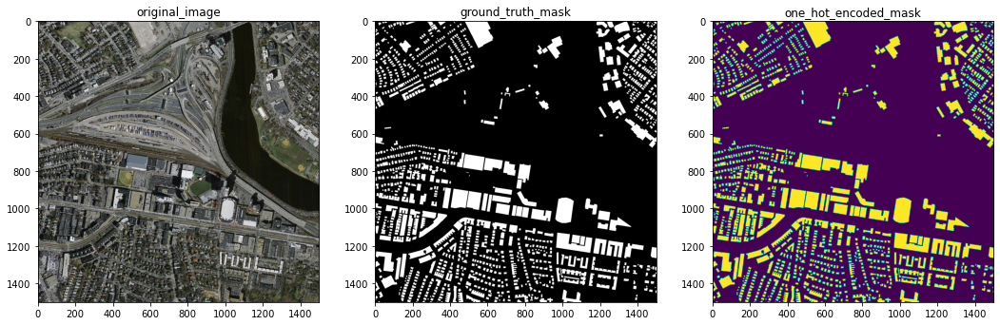

In [14]:
#We get an indexed type of data so we would not need to name every object [Indexed Objects]
dataset = Create_Dataset(x_train, y_train, corresponding_class_rgb_values=label_rgb_values)
#choosing random index
random_idx = random.randint(0, len(dataset)-1)
#Use of get Item
image, mask = dataset[random_idx]

display_masks(
    original_image = image,
    ground_truth_mask = colour_code_segmentation(reverse_one_hot_encoding(mask), label_rgb_values),
    one_hot_encoded_mask = reverse_one_hot_encoding(mask)
)

In [10]:
a = np.array([ [[1,1,1],[0,0,0],[1,1,1]], [[1,1,1],[0,0,0],[0,0,0]], [[1,1,1],[0,0,0],[1,1,1]] ])
col = [[1,1,1],[0,0,0]]

encoded_class_map = []
for colour in col:
    compare = np.equal(a, colour)
    print("eq map",compare.shape)
    print(compare)
    print()
    class_map = np.all(compare, axis = -1)
    print("class map", class_map.shape)
    print(class_map)
    encoded_class_map.append(class_map)

print()
print("encoded_class_map")
print(encoded_class_map)
encoded_class_map = np.stack(encoded_class_map, axis=-1)
print()
print('final semantic map')
print(encoded_class_map)

eq map (3, 3, 3)
[[[ True  True  True]
  [False False False]
  [ True  True  True]]

 [[ True  True  True]
  [False False False]
  [False False False]]

 [[ True  True  True]
  [False False False]
  [ True  True  True]]]

class map (3, 3)
[[ True False  True]
 [ True False False]
 [ True False  True]]
eq map (3, 3, 3)
[[[False False False]
  [ True  True  True]
  [False False False]]

 [[False False False]
  [ True  True  True]
  [ True  True  True]]

 [[False False False]
  [ True  True  True]
  [False False False]]]

class map (3, 3)
[[False  True False]
 [False  True  True]
 [False  True False]]

encoded_class_map
[array([[ True, False,  True],
       [ True, False, False],
       [ True, False,  True]]), array([[False,  True, False],
       [False,  True,  True],
       [False,  True, False]])]

final semantic map
[[[ True False]
  [False  True]
  [ True False]]

 [[ True False]
  [False  True]
  [False  True]]

 [[ True False]
  [False  True]
  [ True False]]]


In [15]:
def get_training_augmentation():
    training_augmentations = [    
        album.RandomCrop(height=256, width=256, always_apply=True),
        album.OneOf(
            [
                album.HorizontalFlip(p=1),
                album.VerticalFlip(p=1),
                album.RandomRotate90(p=1),
            ],
            p=0.75,
        ),
        #album.RandomBrightnessContrast(p=0.8),    
        #album.RandomGamma(p=0.8)
    ]
    return album.Compose(training_augmentations)



def get_validation_augmentation():   
    # padding to ensure image 
    validation_augmentations = [
        album.PadIfNeeded(min_height=1536, min_width=1536, always_apply=True, border_mode=0),
    ]
    return album.Compose(validation_augmentations)

def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn=None):
      
    _transform = []
    if preprocessing_fn:
        _transform.append(album.Lambda(image=preprocessing_fn))
    _transform.append(album.Lambda(image=to_tensor, mask=to_tensor))
        
    return album.Compose(_transform)


137


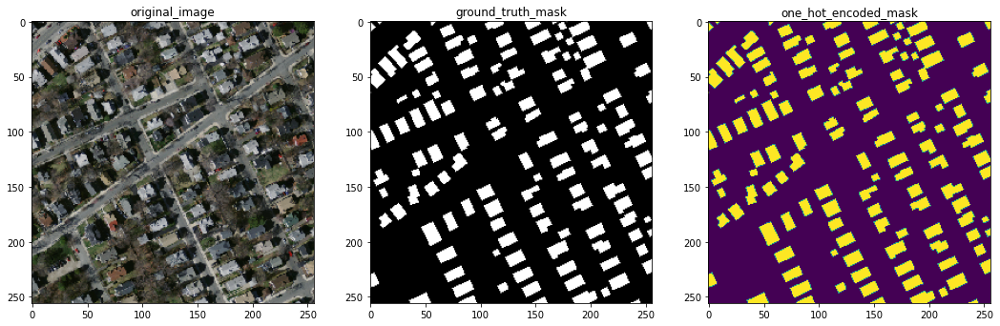

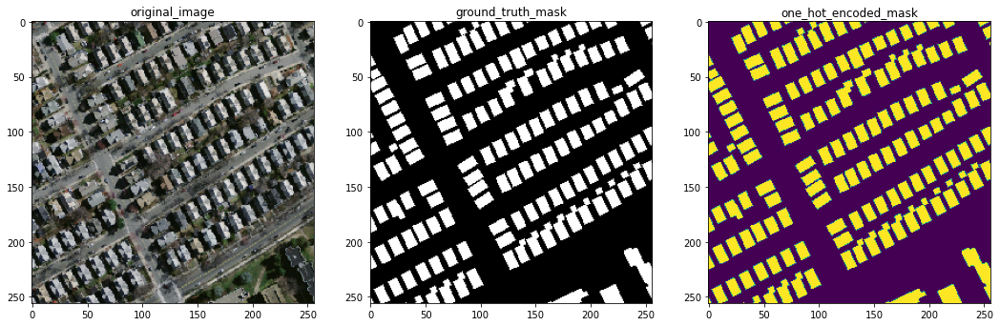

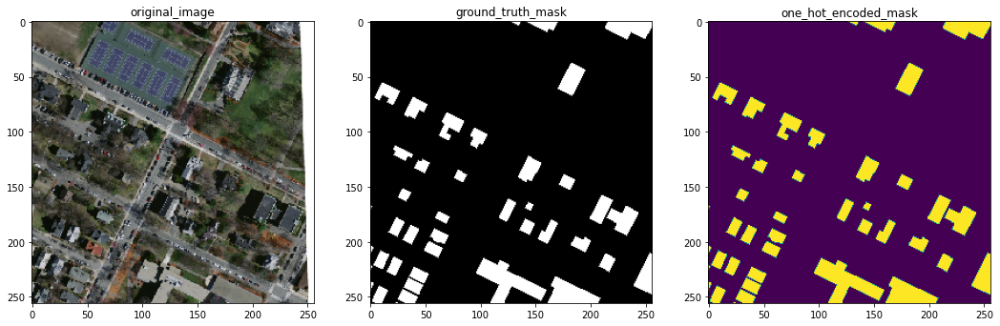

In [16]:
augmented_dataset = Create_Dataset(
    x_train, y_train, 
    augmentation=get_training_augmentation(),
    corresponding_class_rgb_values=label_rgb_values
)

random_idx = random.randint(0, len(augmented_dataset)-1)
print (len(augmented_dataset))

# Different augmentations on a random image/ground trut mask pair 
# Random Crop is applied 
# Random horizontal/vertical/rotate is applied
for i in range(3):
    image, mask = augmented_dataset[random_idx]
    display_masks(
        original_image = image,
        ground_truth_mask = colour_code_segmentation(reverse_one_hot_encoding(mask), label_rgb_values),
        one_hot_encoded_mask = reverse_one_hot_encoding(mask)
    )

In [17]:
# Model

ENCODER = 'resnet50'
ENCODER_WEIGHTS = 'imagenet'
# Building or Non-Building Class
CLASSES = final_label_names
ACTIVATION = 'sigmoid'

# create segmentation model with pretrained encoder
model = smp.Unet(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=len(CLASSES), 
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

In [18]:
#Get Train / Val DataLoaders

train_dataset = Create_Dataset(
    x_train, y_train, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn),
    corresponding_class_rgb_values=label_rgb_values,
)

valid_dataset = Create_Dataset(
    x_val, y_val, 
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    corresponding_class_rgb_values=label_rgb_values,
)

# Get train and val data loaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=0)
valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False, num_workers=0)

In [14]:
'''
#Initial round of training with 10 epochs
TRAINING = True

# Set num of epochs
EPOCHS = 10

DEVICE = torch.device("cpu")

# loss function
loss = smp.utils.losses.DiceLoss()

# define metrics
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
]

# define optimizer
optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.0001),
])

# define learning rate scheduler 
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer, T_0=1, T_mult=2, eta_min=5e-5,
)

if os.path.exists('G:/Major Project/Dataset/weights/best_model.pth'):
    model = torch.load('G:/Major Project/Dataset/weights/best_model.pth', map_location=DEVICE)
'''

In [13]:
'''
#Initial round of training with 25 epochs
TRAINING = True

# Set num of epochs
EPOCHS = 25

DEVICE = torch.device("cpu")

# loss function
loss = smp.utils.losses.DiceLoss()

# define metrics
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
]

# define optimizer
optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.0001),
])

#--

if os.path.exists('G:/Major Project/Dataset/weights/best_model_25_epochs.pth'):
    model = torch.load('G:/Major Project/Dataset/weights/best_model_25_epochs.pth', map_location=DEVICE)
'''

In [19]:
#Initial round of training with 50 epochs - PNG
TRAINING = True

# Set num of epochs
EPOCHS = 50

DEVICE = torch.device("cpu")

# loss function
loss = smp.utils.losses.DiceLoss()

# define metrics
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
]

# define optimizer
optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.0001),
])

# learning rate scheduler
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer, T_0=1, T_mult=2, eta_min=5e-5,
)

if os.path.exists('G:/Major Project/Dataset/weights/best_model_50png_noaug_epochs.pth'):
    model = torch.load('G:/Major Project/Dataset/weights/best_model_50png_noaug_epochs.pth', map_location=DEVICE)

In [20]:
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [19]:
'''
# training for 10 epochs
%%time
weights_path = 'G:/Major Project/Dataset/weights/'

if not os.path.exists(weights_path):
    os.makedirs(weights_path)
    
if TRAINING:

    best_iou_score = 0.0
    train_logs_list, valid_logs_list = [], []

    for i in range(0, EPOCHS):

        # Perform training & validation
        print('\nEpoch: {}'.format(i))
        train_logs = train_epoch.run(train_loader)
        valid_logs = valid_epoch.run(valid_loader)
        train_logs_list.append(train_logs)
        valid_logs_list.append(valid_logs)

        # Save model if a better val IoU score is obtained
        if best_iou_score < valid_logs['iou_score']:
            best_iou_score = valid_logs['iou_score']
            torch.save(model, 'G:/Major Project/Dataset/weights/best_model.pth')
            print('Model saved!')
'''

sad

Epoch: 0
valid: 100%|█████████████████████████████████████| 4/4 [00:46<00:00, 11.60s/it, dice_loss - 0.6287, iou_score - 0.2114]
Model saved!

Epoch: 1
valid: 100%|█████████████████████████████████████| 4/4 [00:48<00:00, 12.06s/it, dice_loss - 0.4998, iou_score - 0.4015]
Model saved!

Epoch: 2
valid: 100%|█████████████████████████████████████| 4/4 [00:46<00:00, 11.72s/it, dice_loss - 0.4462, iou_score - 0.4346]
Model saved!

Epoch: 3
valid: 100%|█████████████████████████████████████| 4/4 [00:47<00:00, 11.78s/it, dice_loss - 0.4206, iou_score - 0.4288]

Epoch: 4
valid: 100%|█████████████████████████████████████| 4/4 [00:46<00:00, 11.66s/it, dice_loss - 0.3831, iou_score - 0.4758]
Model saved!

Epoch: 5
valid: 100%|█████████████████████████████████████| 4/4 [00:46<00:00, 11.60s/it, dice_loss - 0.3648, iou_score - 0.5922]
Model saved!

Epoch: 6
valid: 100%|█████████████████████████████████████| 4/4 [00:48<00:00, 12.14s/it, dice_loss - 0.3592, iou_score - 0.6649]
Model saved!

Epoch: 

In [28]:
'''
#Second round training - 25 epocs
weights_path = 'G:/Major Project/Dataset/weights/'

if not os.path.exists(weights_path):
    print('sad sathyam')
    os.makedirs(weights_path)
    
if TRAINING:

    best_iou_score = 0.0
    train_logs_list, valid_logs_list = [], []

    for i in range(0, EPOCHS):

        # Perform training & validation
        print('\nEpoch: {}'.format(i))
        train_logs = train_epoch.run(train_loader)
        valid_logs = valid_epoch.run(valid_loader)
        train_logs_list.append(train_logs)
        valid_logs_list.append(valid_logs)

        # Save model if a better val IoU score is obtained
        if best_iou_score < valid_logs['iou_score']:
            best_iou_score = valid_logs['iou_score']
            torch.save(model, 'G:/Major Project/Dataset/weights/best_model_25_epochs.pth')
            print('Model saved!')
'''




Epoch: 0
valid: 100%|█████████████████████████████████████| 4/4 [00:56<00:00, 14.23s/it, dice_loss - 0.5623, iou_score - 0.3076]
Model saved!

Epoch: 1
valid: 100%|██████████████████████████████████████| 4/4 [00:56<00:00, 14.13s/it, dice_loss - 0.4504, iou_score - 0.551]
Model saved!

Epoch: 2
valid: 100%|██████████████████████████████████████| 4/4 [00:47<00:00, 11.86s/it, dice_loss - 0.413, iou_score - 0.5657]
Model saved!

Epoch: 3
valid: 100%|█████████████████████████████████████| 4/4 [00:51<00:00, 12.82s/it, dice_loss - 0.3643, iou_score - 0.6307]
Model saved!

Epoch: 4
valid: 100%|█████████████████████████████████████| 4/4 [00:56<00:00, 14.14s/it, dice_loss - 0.3335, iou_score - 0.6764]
Model saved!

Epoch: 5
valid: 100%|█████████████████████████████████████| 4/4 [00:50<00:00, 12.67s/it, dice_loss - 0.3179, iou_score - 0.7011]
Model saved!

Epoch: 6
valid: 100%|█████████████████████████████████████| 4/4 [00:52<00:00, 13.12s/it, dice_loss - 0.3006, iou_score - 0.7384]
Model saved!

In [23]:
#Second round training - 50 epocs

weights_path = 'G:/Major Project/Dataset/weights/'

if not os.path.exists(weights_path):
    os.makedirs(weights_path)
    
if TRAINING:

    best_iou_score = 0.0
    train_logs_list, valid_logs_list = [], []

    for i in range(0, EPOCHS):

        # Perform training & validation
        print('\nEpoch: {}'.format(i))
        train_logs = train_epoch.run(train_loader)
        valid_logs = valid_epoch.run(valid_loader)
        train_logs_list.append(train_logs)
        valid_logs_list.append(valid_logs)

        # Save model if a better val IoU score is obtained
        if best_iou_score < valid_logs['iou_score']:
            best_iou_score = valid_logs['iou_score']
            torch.save(model, 'G:/Major Project/Dataset/weights/best_model_50aug_epochs.pth')
            print('Model saved!')



Epoch: 0
valid: 100%|█████████████████████████████████████| 4/4 [00:57<00:00, 14.44s/it, dice_loss - 0.1235, iou_score - 0.8494]
Model saved!

Epoch: 1
valid: 100%|█████████████████████████████████████| 4/4 [00:51<00:00, 12.82s/it, dice_loss - 0.1216, iou_score - 0.8514]
Model saved!

Epoch: 2
valid: 100%|█████████████████████████████████████| 4/4 [00:51<00:00, 12.78s/it, dice_loss - 0.1184, iou_score - 0.8494]

Epoch: 3
valid: 100%|█████████████████████████████████████| 4/4 [00:50<00:00, 12.63s/it, dice_loss - 0.1162, iou_score - 0.8518]
Model saved!

Epoch: 4
valid: 100%|██████████████████████████████████████| 4/4 [00:52<00:00, 13.18s/it, dice_loss - 0.1335, iou_score - 0.833]

Epoch: 5
valid: 100%|█████████████████████████████████████| 4/4 [00:47<00:00, 11.78s/it, dice_loss - 0.1251, iou_score - 0.8421]

Epoch: 6
valid: 100%|██████████████████████████████████████| 4/4 [00:48<00:00, 12.04s/it, dice_loss - 0.113, iou_score - 0.8546]
Model saved!

Epoch: 7
valid: 100%|████████████████

In [37]:
#4th round training - 50 epocs - PNG

weights_path = 'G:/Major Project/Dataset/weights/'

if not os.path.exists(weights_path):
    os.makedirs(weights_path)
    
if TRAINING:

    best_iou_score = 0.0
    train_logs_list, valid_logs_list = [], []

    for i in range(0, EPOCHS):

        # Perform training & validation
        print('\nEpoch: {}'.format(i))
        train_logs = train_epoch.run(train_loader)
        valid_logs = valid_epoch.run(valid_loader)
        train_logs_list.append(train_logs)
        valid_logs_list.append(valid_logs)

        # Save model if a better val IoU score is obtained
        if best_iou_score < valid_logs['iou_score']:
            best_iou_score = valid_logs['iou_score']
            torch.save(model, 'G:/Major Project/Dataset/weights/best_model_50png_epochs.pth')
            print('Model saved!')


Epoch: 0
valid: 100%|█████████████████████████████████████| 4/4 [00:53<00:00, 13.39s/it, dice_loss - 0.5815, iou_score - 0.2014]
Model saved!

Epoch: 1
valid: 100%|█████████████████████████████████████| 4/4 [00:53<00:00, 13.38s/it, dice_loss - 0.5597, iou_score - 0.1655]

Epoch: 2
valid: 100%|███████████████████████████████████████| 4/4 [00:51<00:00, 12.84s/it, dice_loss - 0.53, iou_score - 0.2549]
Model saved!

Epoch: 3
valid: 100%|██████████████████████████████████████| 4/4 [00:50<00:00, 12.64s/it, dice_loss - 0.496, iou_score - 0.3214]
Model saved!

Epoch: 4
valid: 100%|█████████████████████████████████████| 4/4 [00:51<00:00, 12.90s/it, dice_loss - 0.4744, iou_score - 0.3611]
Model saved!

Epoch: 5
valid: 100%|█████████████████████████████████████| 4/4 [00:54<00:00, 13.69s/it, dice_loss - 0.4557, iou_score - 0.3912]
Model saved!

Epoch: 6
valid: 100%|█████████████████████████████████████| 4/4 [00:53<00:00, 13.26s/it, dice_loss - 0.4467, iou_score - 0.4267]
Model saved!

Epoch: 7
va

In [15]:
#4th round training - 50 epocs - PNG - NOAUG

weights_path = 'G:/Major Project/Dataset/weights/'

if not os.path.exists(weights_path):
    os.makedirs(weights_path)
    
if TRAINING:

    best_iou_score = 0.0
    train_logs_list, valid_logs_list = [], []

    for i in range(0, EPOCHS):

        # Perform training & validation
        print('\nEpoch: {}'.format(i))
        train_logs = train_epoch.run(train_loader)
        valid_logs = valid_epoch.run(valid_loader)
        train_logs_list.append(train_logs)
        valid_logs_list.append(valid_logs)

        # Save model if a better val IoU score is obtained
        if best_iou_score < valid_logs['iou_score']:
            best_iou_score = valid_logs['iou_score']
            torch.save(model, 'G:/Major Project/Dataset/weights/best_model_50png_noaug_epochs.pth')
            print('Model saved!')


Epoch: 0
valid: 100%|█████████████████████████████████████| 4/4 [00:48<00:00, 12.16s/it, dice_loss - 0.4938, iou_score - 0.3999]
Model saved!

Epoch: 1
valid: 100%|█████████████████████████████████████| 4/4 [00:46<00:00, 11.73s/it, dice_loss - 0.4352, iou_score - 0.5196]
Model saved!

Epoch: 2
valid: 100%|█████████████████████████████████████| 4/4 [00:46<00:00, 11.69s/it, dice_loss - 0.3769, iou_score - 0.6174]
Model saved!

Epoch: 3
valid: 100%|██████████████████████████████████████| 4/4 [00:57<00:00, 14.48s/it, dice_loss - 0.338, iou_score - 0.6812]
Model saved!

Epoch: 4
valid: 100%|█████████████████████████████████████| 4/4 [00:58<00:00, 14.71s/it, dice_loss - 0.3235, iou_score - 0.6828]
Model saved!

Epoch: 5
valid: 100%|█████████████████████████████████████| 4/4 [01:06<00:00, 16.57s/it, dice_loss - 0.3077, iou_score - 0.6931]
Model saved!

Epoch: 6
valid: 100%|█████████████████████████████████████| 4/4 [00:59<00:00, 14.82s/it, dice_loss - 0.2805, iou_score - 0.7387]
Model saved!

In [15]:
'''
#Prediction on the test data
# load best saved model checkpoint from the current run
if os.path.exists('G:/Major Project/Dataset/weights/best_model.pth'):
    best_model = torch.load('G:/Major Project/Dataset/weights/best_model.pth', map_location=DEVICE)
    print('Loaded UNet model from this run.')
    
# load best saved model checkpoint from previous commit (if present)
elif os.path.exists('G:/Major Project/Dataset/weights/best_model.pth'):
    best_model = torch.load('G:/Major Project/Dataset/weights/best_model.pth', map_location=DEVICE)
    print('Loaded UNet model from a previous commit.')
'''

Loaded UNet model from this run.


In [16]:
'''
# 2nd round of training
#Prediction on the test data
# load best saved model checkpoint from the current run
if os.path.exists('G:/Major Project/Dataset/weights/best_model_25_epochs.pth'):
    best_model = torch.load('G:/Major Project/Dataset/weights/best_model_25_epochs.pth', map_location=DEVICE)
    print('Loaded UNet model from this run.')
    
# load best saved model checkpoint from previous commit (if present)
elif os.path.exists('G:/Major Project/Dataset/weights/best_model_25_epochs.pth'):
    best_model = torch.load('G:/Major Project/Dataset/weights/best_model_25_epochs.pth', map_location=DEVICE)
    print('Loaded UNet model from a previous commit.')
'''

Loaded UNet model from this run.


In [21]:
'''
# 3rd round of training
#Prediction on the test data
# load best saved model checkpoint from the current run
if os.path.exists('G:/Major Project/Dataset/weights/best_model_50_epochs.pth'):
    best_model = torch.load('G:/Major Project/Dataset/weights/best_model_50_epochs.pth', map_location=DEVICE)
    print('Loaded UNet model from this run.')
    
# load best saved model checkpoint from previous commit (if present)
elif os.path.exists('G:/Major Project/Dataset/weights/best_model_50_epochs.pth'):
    best_model = torch.load('G:/Major Project/Dataset/weights/best_model_50_epochs.pth', map_location=DEVICE)
    print('Loaded UNet model from a previous commit.')
'''

Loaded UNet model from this run.


In [15]:

# 4th round of training
#Prediction on the test data
# load best saved model checkpoint from the current run
if os.path.exists('G:/Major Project/Dataset/weights/best_model_50aug_epochs.pth'):
    best_model = torch.load('G:/Major Project/Dataset/weights/best_model_50aug_epochs.pth', map_location=DEVICE)
    print('Loaded UNet model from this run.')
    
# load best saved model checkpoint from previous commit (if present)
elif os.path.exists('G:/Major Project/Dataset/weights/best_model_50aug_epochs.pth'):
    best_model = torch.load('G:/Major Project/Dataset/weights/best_model_50aug_epochs.pth', map_location=DEVICE)
    print('Loaded UNet model from a previous commit.')


Loaded UNet model from this run.


In [38]:

# 5th round of training - PNG
#Prediction on the test data
# load best saved model checkpoint from the current run
if os.path.exists('G:/Major Project/Dataset/weights/best_model_50png_epochs.pth'):
    best_model = torch.load('G:/Major Project/Dataset/weights/best_model_50png_epochs.pth', map_location=DEVICE)
    print('Loaded UNet model from this run.')
    
# load best saved model checkpoint from previous commit (if present)
elif os.path.exists('G:/Major Project/Dataset/weights/best_model_50png_epochs.pth'):
    best_model = torch.load('G:/Major Project/Dataset/weights/best_model_50png_epochs.pth', map_location=DEVICE)
    print('Loaded UNet model from a previous commit.')


Loaded UNet model from this run.


In [21]:
'''
# 6th round of training - PNG
#Prediction on the test data
# load best saved model checkpoint from the current run
if os.path.exists('G:/Major Project/Dataset/weights/best_model_50png_noaug_epochs.pth'):
    best_model = torch.load('G:/Major Project/Dataset/weights/best_model_50png_noaug_epochs.pth', map_location=DEVICE)
    print('Loaded UNet model from this run.')
    
# load best saved model checkpoint from previous commit (if present)
elif os.path.exists('G:/Major Project/Dataset/weights/best_model_50png_noaug_epochs.pth'):
    best_model = torch.load('G:/Major Project/Dataset/weights/best_model_50png_noaug_epochs.pth', map_location=DEVICE)
    print('Loaded UNet model from a previous commit.')'''


Loaded UNet model from this run.


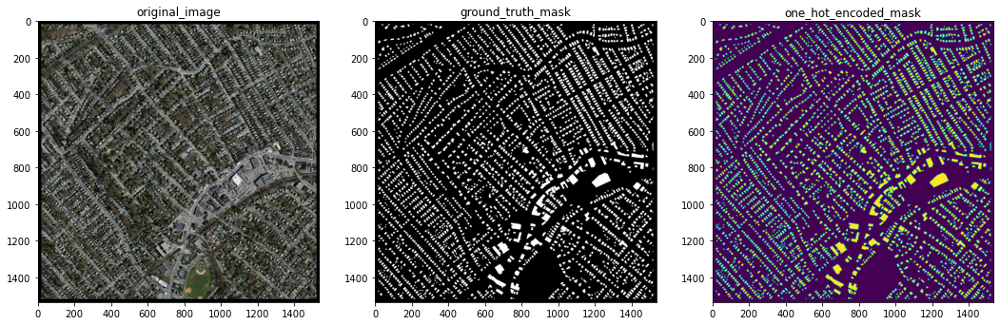

In [39]:
#Loading and Visualization of the given test dataset
test_dataset = Create_Dataset(
    x_test, 
    y_test, 
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    corresponding_class_rgb_values=label_rgb_values,
)

test_dataloader = DataLoader(test_dataset)

# test dataset for visualization (without preprocessing transformations)
test_dataset_vis = Create_Dataset(
    x_test, 
    y_test, 
    augmentation=get_validation_augmentation(),
    corresponding_class_rgb_values=label_rgb_values,
)

# get a random test image/mask index
random_idx = random.randint(0, len(test_dataset_vis)-1)
image, mask = test_dataset_vis[random_idx]

display_masks(
    original_image = image,
    ground_truth_mask = colour_code_segmentation(reverse_one_hot_encoding(mask), label_rgb_values),
    one_hot_encoded_mask = reverse_one_hot_encoding(mask)
)

In [40]:
# Since I cropped the images, padding images to match initial dimentions if needed
def crop_image(image, target_image_dims=[1500,1500,3]):
   
    target_size = target_image_dims[0]
    image_size = len(image)
    padding = (image_size - target_size) // 2

    return image[
        padding:image_size - padding,
        padding:image_size - padding,
        :,
    ]

sample_preds_folder = 'G:/Major Project/Dataset/sample_predictions/'
if not os.path.exists(sample_preds_folder):
    os.makedirs(sample_preds_folder)

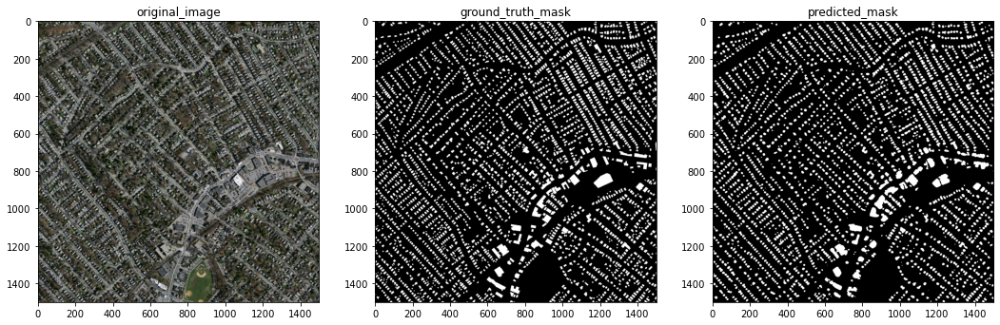

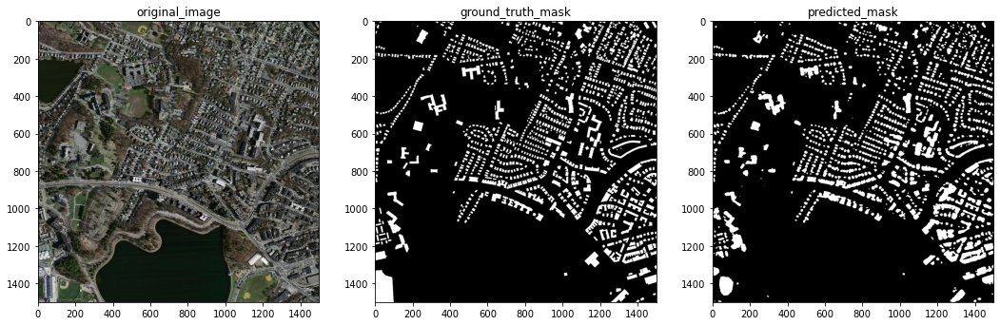

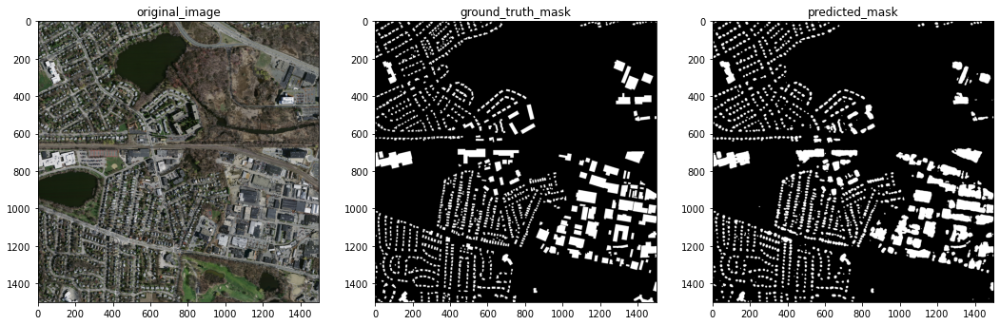

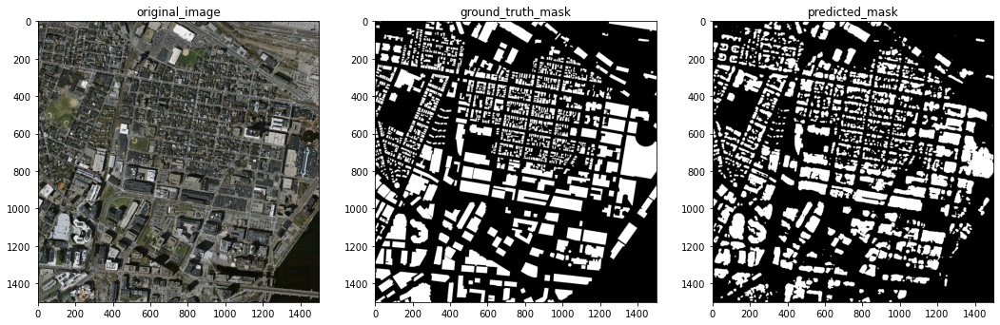

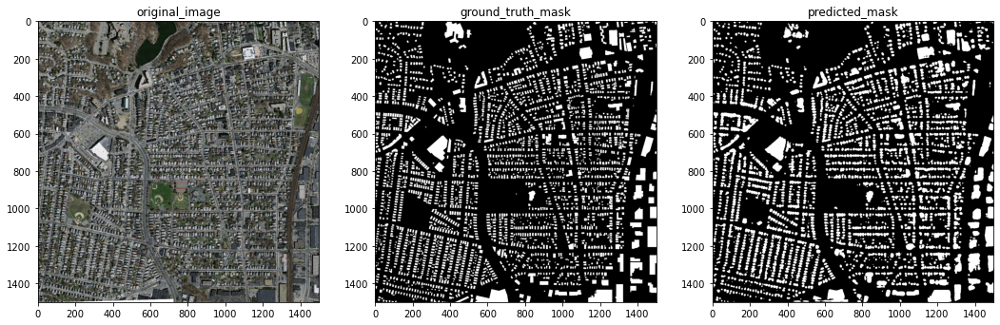

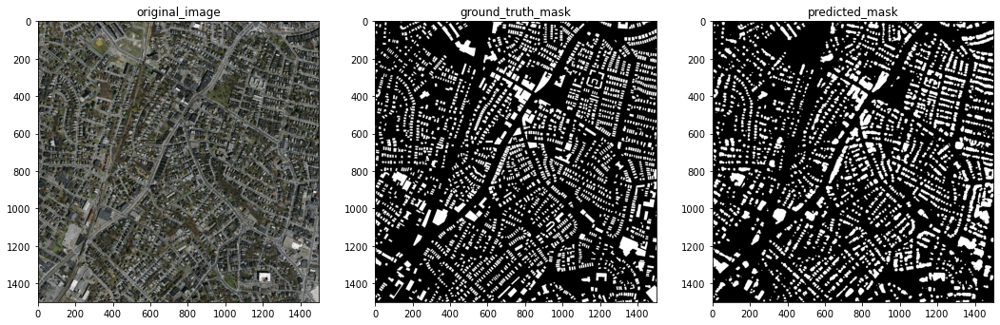

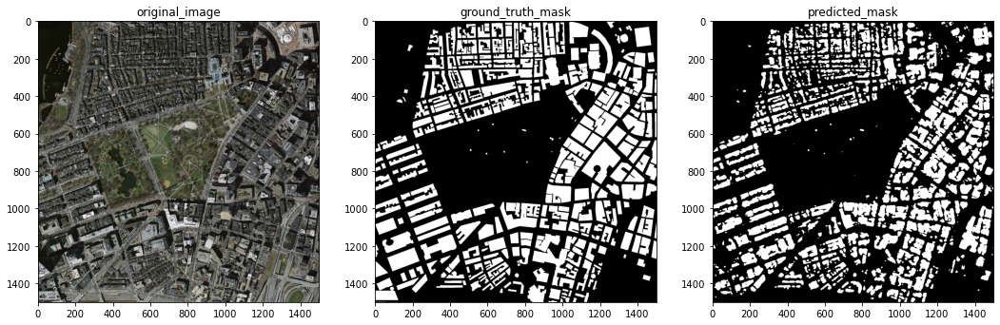

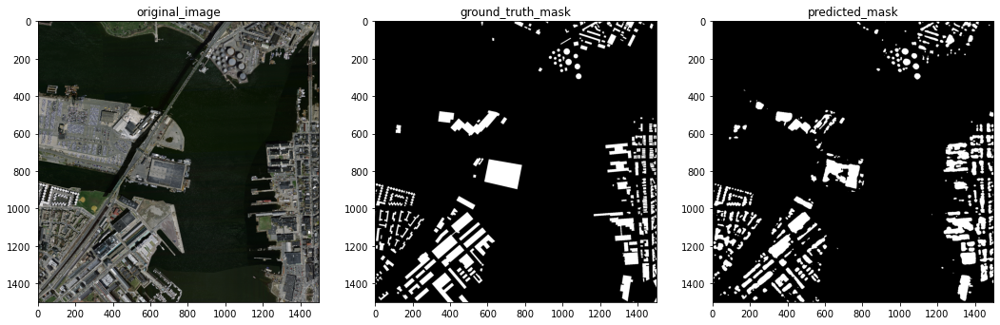

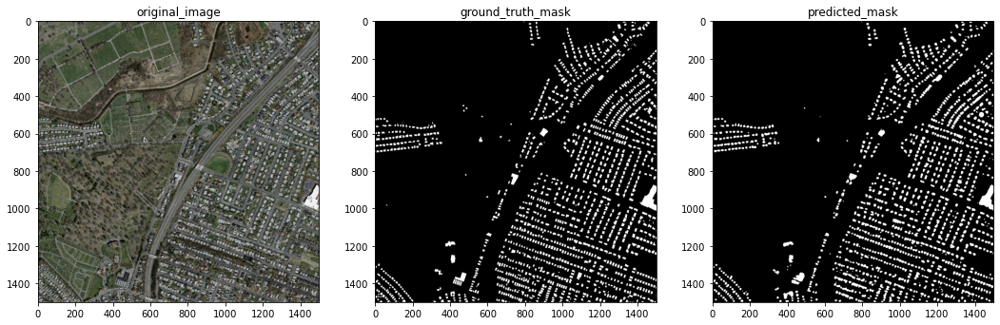

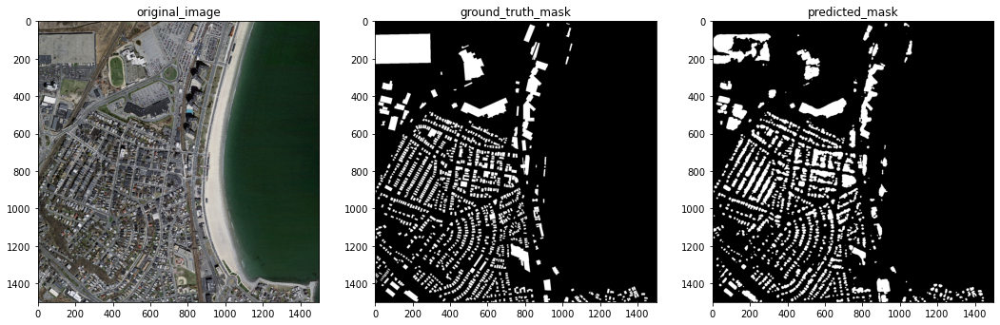

In [41]:
for i in range(len(test_dataset)):
    
    # load image from the test dataset
    image, ground_truth_mask = test_dataset[i]
    final_image = crop_image(test_dataset_vis[i][0].astype('uint8'))
    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    
    # Predict test image
    predicted_mask = best_model(x_tensor)
    predicted_mask = predicted_mask.detach().squeeze().cpu().numpy()
    predicted_mask = np.transpose(predicted_mask,(1,2,0))
    
    # Get prediction channel corresponding to building
    pred_building_heatmap = predicted_mask[:,:,final_label_names.index('building')]
    predicted_mask = crop_image(colour_code_segmentation(reverse_one_hot_encoding(predicted_mask), label_rgb_values))
    
    ground_truth_mask = np.transpose(ground_truth_mask,(1,2,0))
    ground_truth_mask = crop_image(colour_code_segmentation(reverse_one_hot_encoding(ground_truth_mask), label_rgb_values))
    cv2.imwrite(os.path.join(sample_preds_folder, f"sample_pred_{i}.png"), np.hstack([final_image, ground_truth_mask, predicted_mask])[:,:,::-1])
    
    display_masks(
        original_image = final_image,
        ground_truth_mask = ground_truth_mask,
        predicted_mask = predicted_mask,
        
    )

In [22]:
# defining the performance metrics
'''metrics1 = [ 
    smp.utils.metrics.IoU(threshold=0.5),
    smp.utils.metrics.Fscore(threshold=0.5),
    smp.utils.metrics.Precision(threshold=0.5),
    smp.utils.metrics.Recall(threshold=0.5),
    smp.utils.metrics.Accuracy(threshold=0.5)
]

#Iterate on the test set
test_epoch = smp.utils.train.ValidEpoch(
    model,
    loss=loss, 
    metrics=metrics1, 
    device=DEVICE,
    verbose=True,
)

#testing
test_logs = test_epoch.run(test_dataloader)
print("Evaluation on Test Data: ")
print(f"Mean IoU Score: {test_logs['iou_score']:.4f}")
print(f"Mean F1-Score: {test_logs['fscore']:.4f}")
print(f"Average Precision : {test_logs['precision']:.4f}")
print(f"Average Recall: {test_logs['recall']:.4f}")
print(f"Overall Accuracy: {test_logs['accuracy']:.4f}")
'''

valid: 100%|█| 10/10 [02:03<00:00, 12.33s/it, dice_loss - 0.3221, iou_score - 0.7157, fscore - 0.8324, precision - 0.80
Evaluation on Test Data: 
Mean IoU Score: 0.7157
Mean F1-Score: 0.8324
Average Precision : 0.8017
Average Recall: 0.8656
Overall Accuracy: 0.8336


In [41]:
# for 2nd round of testing
'''print("Results for 25 epochs")
metrics2 = [ 
    smp.utils.metrics.IoU(threshold=0.5),
    smp.utils.metrics.Fscore(threshold=0.5),
    smp.utils.metrics.Precision(threshold=0.5),
    smp.utils.metrics.Recall(threshold=0.5),
    smp.utils.metrics.Accuracy(threshold=0.5)
]

#Iterate on the test set
test_epoch = smp.utils.train.ValidEpoch(
    model,
    loss=loss, 
    metrics=metrics2, 
    device=DEVICE,
    verbose=True,
)

#testing
test_logs = test_epoch.run(test_dataloader)
print("Evaluation on Test Data: ")
print(f"Mean IoU Score: {test_logs['iou_score']:.3f}")
print(f"Mean F1-Score: {test_logs['fscore']:.3f}")
print(f"Average Precision : {test_logs['precision']:.3f}")
print(f"Average Recall: {test_logs['recall']:.3f}")
print(f"Overall Accuracy: {test_logs['accuracy']:.3f}")
'''

Results for 25 epochs
valid: 100%|█| 10/10 [02:20<00:00, 14.08s/it, dice_loss - 0.2255, iou_score - 0.7835, fscore - 0.8775, precision - 0.85
Evaluation on Test Data: 
Mean IoU Score: 0.784
Mean F1-Score: 0.878
Average Precision : 0.858
Average Recall: 0.898
Overall Accuracy: 0.881


In [26]:
# for 3rd round of testing
'''
print("Results for 50 epochs")
metrics3 = [ 
    smp.utils.metrics.IoU(threshold=0.5),
    smp.utils.metrics.Fscore(threshold=0.5),
    smp.utils.metrics.Precision(threshold=0.5),
    smp.utils.metrics.Recall(threshold=0.5),
    smp.utils.metrics.Accuracy(threshold=0.5)
]

#Iterate on the test set
test_epoch = smp.utils.train.ValidEpoch(
    model,
    loss=loss, 
    metrics=metrics3, 
    device=DEVICE,
    verbose=True,
)

#testing
test_logs = test_epoch.run(test_dataloader)
print("Evaluation on Test Data: ")
print(f"Mean IoU Score: {test_logs['iou_score']:.3f}")
print(f"Mean F1-Score: {test_logs['fscore']:.3f}")
print(f"Average Precision : {test_logs['precision']:.3f}")
print(f"Average Recall: {test_logs['recall']:.3f}")
print(f"Overall Accuracy: {test_logs['accuracy']:.3f}")'''

Results for 50 epochs
valid: 100%|█| 10/10 [03:51<00:00, 23.13s/it, dice_loss - 0.1573, iou_score - 0.8056, fscore - 0.8912, precision - 0.86
Evaluation on Test Data: 
Mean IoU Score: 0.806
Mean F1-Score: 0.891
Average Precision : 0.867
Average Recall: 0.917
Overall Accuracy: 0.893


In [19]:
'''
# for 4th round of testing - Augmented

print("Results for 50 augmen epochs")
metrics4 = [ 
    smp.utils.metrics.IoU(threshold=0.5),
    smp.utils.metrics.Fscore(threshold=0.5),
    smp.utils.metrics.Precision(threshold=0.5),
    smp.utils.metrics.Recall(threshold=0.5),
    smp.utils.metrics.Accuracy(threshold=0.5)
]

#Iterate on the test set
test_epoch = smp.utils.train.ValidEpoch(
    model,
    loss=loss, 
    metrics=metrics4, 
    device=DEVICE,
    verbose=True,
)

#testing
test_logs = test_epoch.run(test_dataloader)
print("Evaluation on Test Data: ")
print(f"Mean IoU Score: {test_logs['iou_score']:.3f}")
print(f"Mean F1-Score: {test_logs['fscore']:.3f}")
print(f"Average Precision : {test_logs['precision']:.3f}")
print(f"Average Recall: {test_logs['recall']:.3f}")
print(f"Overall Accuracy: {test_logs['accuracy']:.3f}")
'''

Results for 50 augmen epochs
valid: 100%|█| 10/10 [04:03<00:00, 24.34s/it, dice_loss - 0.1992, iou_score - 0.7986, fscore - 0.8869, precision - 0.85
Evaluation on Test Data: 
Mean IoU Score: 0.799
Mean F1-Score: 0.887
Average Precision : 0.856
Average Recall: 0.920
Overall Accuracy: 0.888


In [42]:

# for 5th round of testing - Augmented - PNG

print("Results for 50 augmen png epochs")
metrics5 = [ 
    smp.utils.metrics.IoU(threshold=0.5),
    smp.utils.metrics.Fscore(threshold=0.5),
    smp.utils.metrics.Precision(threshold=0.5),
    smp.utils.metrics.Recall(threshold=0.5),
    smp.utils.metrics.Accuracy(threshold=0.5)
]

#Iterate on the test set
test_epoch = smp.utils.train.ValidEpoch(
    model,
    loss=loss, 
    metrics=metrics5, 
    device=DEVICE,
    verbose=True,
)

#testing
test_logs = test_epoch.run(test_dataloader)
print("Evaluation on Test Data: ")
print(f"Mean IoU Score: {test_logs['iou_score']:.3f}")
print(f"Mean F1-Score: {test_logs['fscore']:.3f}")
print(f"Average Precision : {test_logs['precision']:.3f}")
print(f"Average Recall: {test_logs['recall']:.3f}")
print(f"Overall Accuracy: {test_logs['accuracy']:.3f}")


Results for 50 augmen png epochs
valid: 100%|█| 10/10 [02:33<00:00, 15.37s/it, dice_loss - 0.1358, iou_score - 0.8184, fscore - 0.8994, precision - 0.87
Evaluation on Test Data: 
Mean IoU Score: 0.818
Mean F1-Score: 0.899
Average Precision : 0.871
Average Recall: 0.930
Overall Accuracy: 0.901


In [25]:
'''
# for 6th round of testing - Augmented - PNG

print("Results for 50 non - augmen png epochs")
metrics6 = [ 
    smp.utils.metrics.IoU(threshold=0.5),
    smp.utils.metrics.Fscore(threshold=0.5),
    smp.utils.metrics.Precision(threshold=0.5),
    smp.utils.metrics.Recall(threshold=0.5),
    smp.utils.metrics.Accuracy(threshold=0.5)
]

#Iterate on the test set
test_epoch = smp.utils.train.ValidEpoch(
    model,
    loss=loss, 
    metrics=metrics6, 
    device=DEVICE,
    verbose=True,
)

#testing
test_logs = test_epoch.run(test_dataloader)
print("Evaluation on Test Data: ")
print(f"Mean IoU Score: {test_logs['iou_score']:.3f}")
print(f"Mean F1-Score: {test_logs['fscore']:.3f}")
print(f"Average Precision : {test_logs['precision']:.3f}")
print(f"Average Recall: {test_logs['recall']:.3f}")
print(f"Overall Accuracy: {test_logs['accuracy']:.3f}")'''

Results for 50 non - augmen png epochs
valid: 100%|█| 10/10 [03:38<00:00, 21.80s/it, dice_loss - 0.1358, iou_score - 0.8184, fscore - 0.8994, precision - 0.87
Evaluation on Test Data: 
Mean IoU Score: 0.818
Mean F1-Score: 0.899
Average Precision : 0.871
Average Recall: 0.930
Overall Accuracy: 0.901


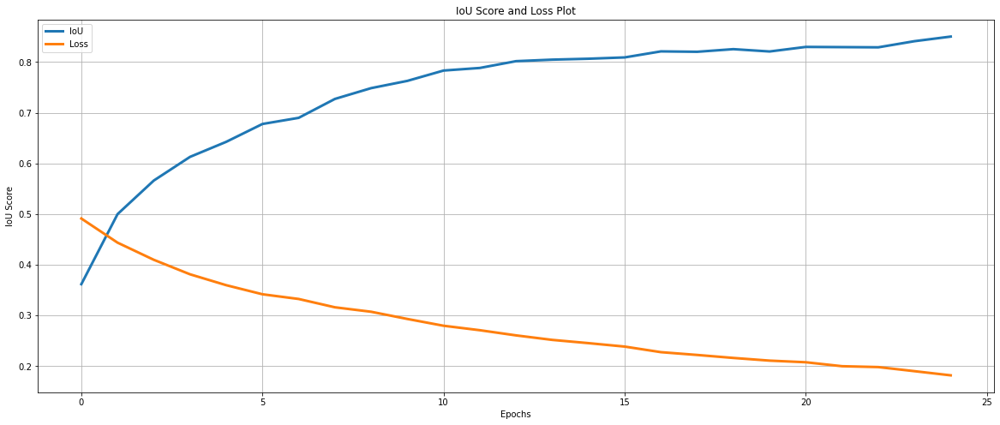

In [9]:
training_IoU = np.array([.3618,0.5,0.5662,0.6129,0.6426,0.6778,0.6899,0.7272,0.7485,0.7628,0.7832,0.7883,0.8017,0.8047,0.8065,0.8091,0.821,0.8202,0.8254,0.8208,0.8298,0.8294,0.829,0.8411,0.8502])
training_loss = np.array([0.4913, 0.4437, 0.4099, 0.3813, 0.3598, 0.3419, 0.3326, 0.3162, 0.3074, 0.2932, 0.2798, 0.271, 0.2608, 0.2519, 0.2455, 0.2387, 0.2277, 0.2222, 0.2163, 0.211, 0.2078, 0.2, 0.1983, 0.1902, 0.182])

training_IoU.T

length = list(range(25))
plt.figure(figsize=(20,8))
plt.plot(length, training_IoU, lw=3, label = 'IoU')
plt.plot(length, training_loss, lw=3, label = 'Loss')
plt.xlabel('Epochs')
plt.ylabel('IoU Score')
plt.title('IoU Score and Loss Plot')
plt.legend(loc='best')
plt.grid()
plt.savefig('iou_score_plot.png')
plt.show()

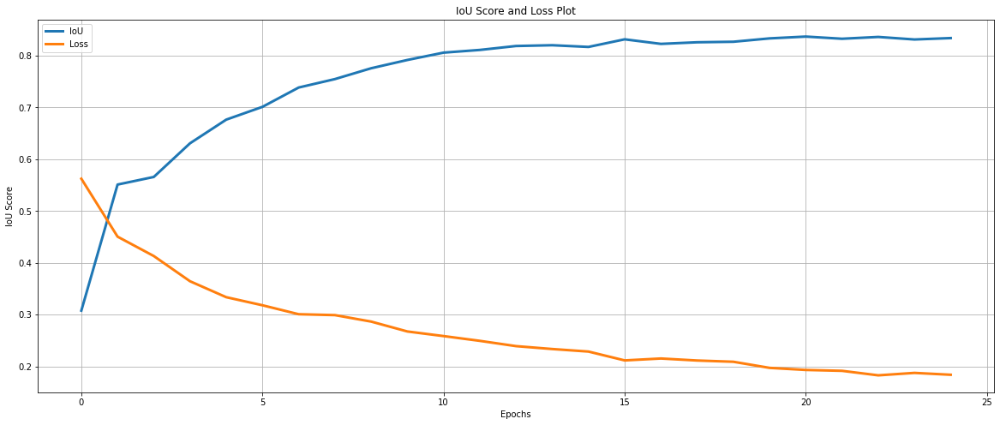

In [4]:
validation_IoU = np.array([.3076,0.551,0.5657,0.6307,0.6764,0.7011,0.7384,0.7547,0.7756,0.7916,0.8058,0.811,0.8186,0.8201,0.8168,0.8315,0.8227,0.8258,0.8268,0.8333,0.8368,0.8326,0.8361,0.8312,0.8339])
validation_loss = np.array([0.5623, 0.4504, 0.413, 0.3643, 0.3335, 0.3179, 0.3006, 0.2989, 0.2864, 0.2673, 0.2584, 0.2492, 0.239, 0.2334, 0.2285, 0.2114, 0.2151, 0.2112, 0.2088, 0.197, 0.193, 0.1913, 0.1826, 0.1873, 0.1837])

validation_IoU.T

length = list(range(25))
plt.figure(figsize=(20,8))
plt.plot(length, validation_IoU, lw=3, label = 'IoU')
plt.plot(length, validation_loss, lw=3, label = 'Loss')
plt.xlabel('Epochs')
plt.ylabel('IoU Score')
plt.title('IoU Score and Loss Plot')
plt.legend(loc='best')
plt.grid()
plt.savefig('val_score_plot.png')
plt.show()



In [2]:
from torchvision import models
from torchsummary import summary
r = models.resnet50()
#torch.cuda.empty_cache()
#best_model = torch.load('G:/Major Project/Dataset/weights/best_model_25_epochs.pth', map_location=torch.device('cpu'))

summary(r,(3,1500,1500),batch_size=1,device = "cpu" )

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [1, 64, 750, 750]           9,408
       BatchNorm2d-2          [1, 64, 750, 750]             128
              ReLU-3          [1, 64, 750, 750]               0
         MaxPool2d-4          [1, 64, 375, 375]               0
            Conv2d-5          [1, 64, 375, 375]           4,096
       BatchNorm2d-6          [1, 64, 375, 375]             128
              ReLU-7          [1, 64, 375, 375]               0
            Conv2d-8          [1, 64, 375, 375]          36,864
       BatchNorm2d-9          [1, 64, 375, 375]             128
             ReLU-10          [1, 64, 375, 375]               0
           Conv2d-11         [1, 256, 375, 375]          16,384
      BatchNorm2d-12         [1, 256, 375, 375]             512
           Conv2d-13         [1, 256, 375, 375]          16,384
      BatchNorm2d-14         [1, 256, 3

Total params: 25,557,032
Trainable params: 25,557,032
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 25.75
Forward/backward pass size (MB): 12883.39
Params size (MB): 97.49
Estimated Total Size (MB): 13006.63
----------------------------------------------------------------


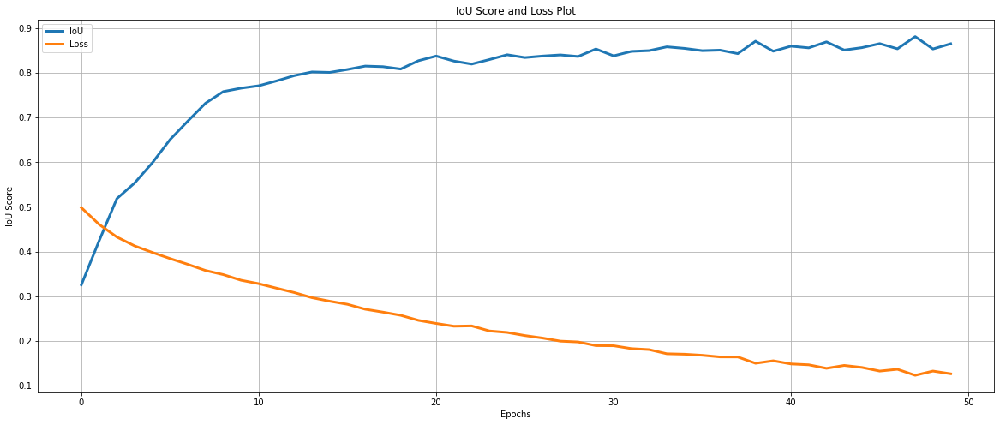

In [6]:
training_IoU = np.array([0.3258,0.4241,0.5185,0.5535,0.5987,0.6507,0.692,0.732,0.758,0.7656,0.771,0.7818,0.7936,0.8019,0.8009,0.8074,0.815,0.8137,0.8084,0.827,0.8375,0.8262,0.8195,0.8296,0.8404,0.8341,0.8375,0.84,0.8365,0.8533,0.8379,0.8479,0.8496,0.8581,0.8546,0.8495,0.8507,0.8429,0.8707,0.8483,0.8596,0.8558,0.8692,0.8509,0.8563,0.8653,0.8537,0.881,0.8533,0.865])

training_loss = np.array([0.4983, 0.4609, 0.4326, 0.4128, 0.3981,  0.3844, 0.3715, 0.3577, 0.3485,0.3359, 0.3282, 0.3182, 0.3084, 0.2969, 0.2890, 0.2821, 0.2711, 0.2646, 0.2575, 0.2462,0.2393, 0.2331, 0.2338, 0.2225, 0.2192, 0.2122, 0.2066, 0.1997, 0.1979, 0.1897, 0.1894, 0.1830, 0.1808, 0.1715, 0.1705, 0.1681, 0.1644, 0.1643, 0.1502, 0.1558, 0.1487,0.1468,0.1389, 0.1454, 0.1409, 0.1328, 0.1368, 0.1233, 0.1328, 0.1267])

training_IoU.T

length = list(range(50))
plt.figure(figsize=(20,8))
plt.plot(length, training_IoU, lw=3, label = 'IoU')
plt.plot(length, training_loss, lw=3, label = 'Loss')
plt.xlabel('Epochs')
plt.ylabel('IoU Score')
plt.title('IoU Score and Loss Plot')
plt.legend(loc='best')
plt.grid()
plt.savefig('iou_score_plot.png')
plt.show()

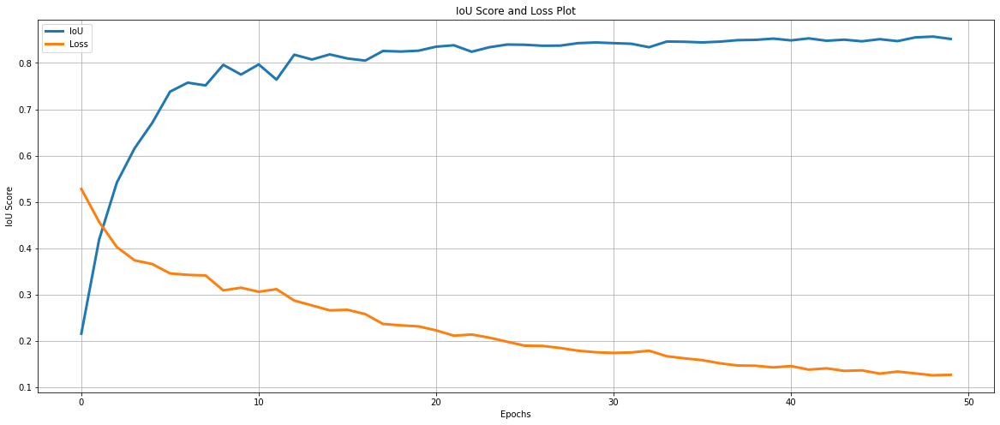

In [4]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
validation_IoU = np.array([0.2156, 0.4184, 0.5417, 0.6157, 0.6709, 0.7381, 0.7575, 0.7515, 0.7960, 0.7750, 0.7969, 0.7640, 0.8179, 0.8075, 0.8185, 0.8097, 0.8051, 0.8259, 0.8247, 0.8265, 0.8352, 0.8382, 0.8243, 0.8340, 0.8398, 0.8393, 0.8372, 0.8375, 0.8428, 0.8443, 0.8428, 0.8415, 0.8340, 0.8463, 0.8458, 0.8444, 0.8461, 0.8493, 0.8499, 0.8526, 0.8488, 0.8531, 0.8480, 0.8503, 0.8468, 0.8514, 0.8472, 0.8552, 0.8570, 0.8519])
validation_loss = np.array([0.528, 0.457, 0.4026, 0.3739, 0.3659, 0.3456, 0.3425, 0.3412, 0.3090, 0.3148, 0.306, 0.3116, 0.287, 0.2765, 0.2659, 0.2671, 0.2578, 0.2366, 0.2335, 0.2313, 0.2226, 0.2112, 0.2138, 0.2069, 0.1982, 0.1895, 0.1891, 0.1846, 0.1787, 0.1754, 0.174, 0.175, 0.1787, 0.1668, 0.1622, 0.1584, 0.1515, 0.1468, 0.1463, 0.1427, 0.1456, 0.1379, 0.1407, 0.1352, 0.1363, 0.1293, 0.1337, 0.1297, 0.1256, 0.1267])

validation_IoU.T

length = list(range(50))
plt.figure(figsize=(20,8))
plt.plot(length, validation_IoU, lw=3, label = 'IoU')
plt.plot(length, validation_loss, lw=3, label = 'Loss')
plt.xlabel('Epochs')
plt.ylabel('IoU Score')
plt.title('IoU Score and Loss Plot')
plt.legend(loc='best')
plt.grid()
plt.savefig('val_score_plot.png')
plt.show()


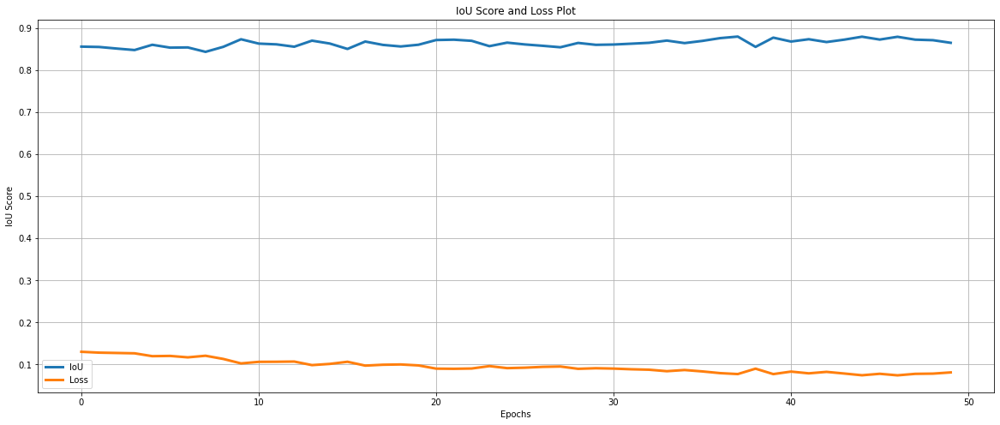

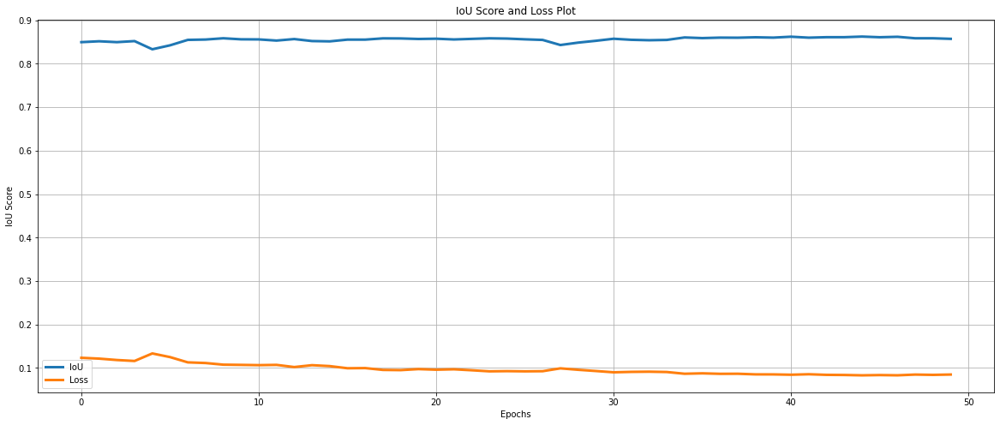

In [3]:
#training loss, training iou, 
# valid loss, valid Iou
# Data for 50 epoch aug
training_loss=[]
training_IoU=[]
validation_loss=[]
validation_IoU=[]
a=np.array([0.1303,0.8558,0.1235,0.8494,0.1283,0.855,0.1216,0.8514,0.1275,
0.8512,0.1184,0.8494,0.1267,0.8477,0.1162,0.8518,0.1199,0.8602,
0.1335,0.833,0.1205,0.8534,0.1251,0.8421,0.1171,0.8539,0.113,
0.8546,0.1209,0.8434,0.1115,0.8554,0.1133,0.8553,0.1077,0.8583,
0.1027,0.8733,0.1072,0.8559,0.1064,0.863,0.1066,0.8557,0.1066,
0.8612,0.1072,0.853,0.1071,0.8556,0.1022,0.8565,0.09866,0.87,0.1065,
0.8519,0.1015,0.8632,0.1044,0.8512,0.1066,0.8503,0.09946,0.8552,
0.09745,0.8679,0.09983,0.8552,0.09954,0.8599,0.09563,0.8581,
0.1002,0.8562,0.09516,0.8579,0.09793,0.8603,0.09752,0.8567,
0.09025,0.8715,0.09612,0.8573,0.08988,0.8723,0.09707,0.8556,
0.09056,0.8696,0.09484,0.8569,0.09629,0.8569,0.0924,0.8582,
0.09146,0.8653,0.09284,0.8576,0.09254,0.861,0.09238,0.8559,
0.09451,0.8578,0.0927,0.8545,0.09534,0.8543,0.09923,0.8428,
0.08984,0.8646,0.09594,0.8483,0.09121,0.8601,0.09312,0.8525,
0.09038,0.8608,0.09015,0.8572,0.08878,0.8628,0.09113,0.8548,
0.08769,0.8649,0.09154,0.8538,0.08419,0.8702,0.09081,0.8545,
0.08697,0.8642,0.08683,0.8602,0.08367,0.8694,0.08778,0.8587,
0.0796,0.876,0.08666,0.8598,0.07738,0.8797,0.08682,0.8596,
0.0902,0.8552,0.08538,0.8606,0.0773,0.8772,0.08531,0.8598,
0.08325,0.8679,0.08457,0.8619,0.0791,0.8734,0.08567,0.8597,
0.08258,0.8667,0.08429,0.8608,0.07865,0.8724,0.084,0.8608,
0.07452,0.8794,0.08318,0.8622,0.078,0.8726,0.08378,0.8607,
0.07435,0.8792,0.08324,0.8617,0.07789,0.8724,0.08492,0.8583,
0.07841,0.8711,0.08424,0.8583,0.0813,0.8649,0.08501,0.857])

for i in range(len(a)):
    if i%4 == 0:
        training_loss.append(a[i])
    elif i%4 == 1:
        training_IoU.append(a[i])
    elif i%4 == 2:
        validation_loss.append(a[i])
    else:
        validation_IoU.append(a[i])
        
training_loss = np.array(training_loss)
training_IoU = np.array(training_IoU)
training_IoU.T

length = list(range(50))
plt.figure(figsize=(20,8))
plt.plot(length, training_IoU, lw=3, label = 'IoU')
plt.plot(length, training_loss, lw=3, label = 'Loss')
plt.xlabel('Epochs')
plt.ylabel('IoU Score')
plt.title('IoU Score and Loss Plot')
plt.legend(loc='best')
plt.grid()
plt.savefig('iou_score_plot.png')
plt.show()

validation_loss = np.array(validation_loss)
validation_IoU = np.array(validation_IoU)
validation_IoU.T

length = list(range(50))
plt.figure(figsize=(20,8))
plt.plot(length, validation_IoU, lw=3, label = 'IoU')
plt.plot(length, validation_loss, lw=3, label = 'Loss')
plt.xlabel('Epochs')
plt.ylabel('IoU Score')
plt.title('IoU Score and Loss Plot')
plt.legend(loc='best')
plt.grid()
plt.savefig('val_score_plot.png')
plt.show()

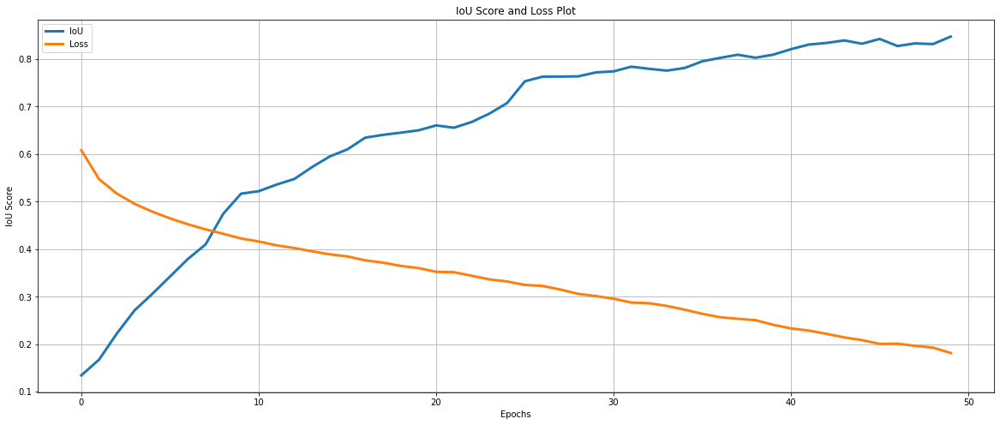

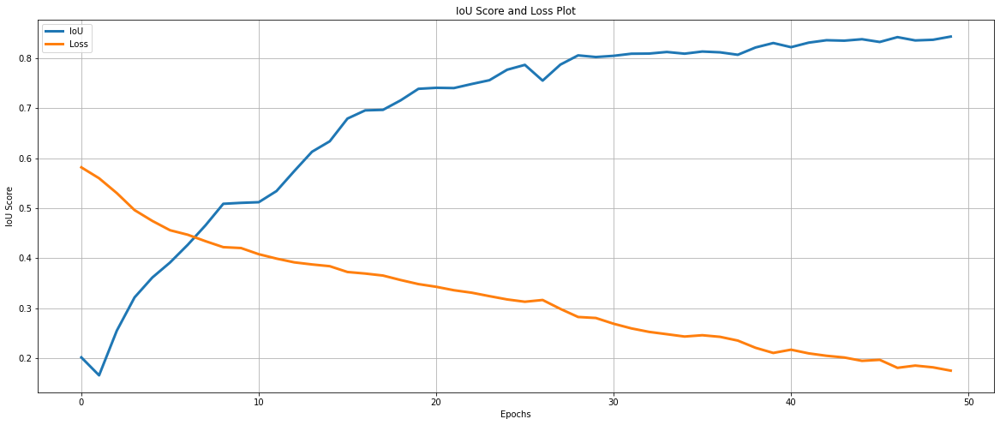

In [4]:
#Data for 50 epoch PNG
import numpy as np
training_loss=[]
training_IoU=[]
validation_loss=[]
validation_IoU=[]
b = [0.608,0.1345,0.5815,0.2014,0.5473,0.1676,0.5597,0.1655,0.5169,0.2224,0.53,0.2549
,0.4953,0.2712,0.496,0.3214,0.4789,0.3059,0.4744,0.3611,0.4647,0.3425,0.4557,0.3912,0.4524
,0.3792,0.4467,0.4267,0.4416,0.4098,0.4338,0.4656,0.4323,0.4745,0.4219,0.5086,0.4225,0.5167
,0.4201,0.5105,0.4161,0.522,0.4078,0.5118,0.408,0.5358,0.399,0.5341,0.4024,0.5476,0.3915,0.574
,0.3954,0.5726,0.3873,0.6127,0.3891,0.595,0.3838,0.6336,0.3846,0.61,0.3722,0.6791,0.3765,0.6346
,0.3691,0.6955,0.3716,0.6405,0.3651,0.6965,0.3648,0.6451,0.3561,0.7156,0.3602,0.65,0.348,0.7386
,0.3523,0.6604,0.3426,0.7406,0.3515,0.6555,0.3357,0.7401,0.344,0.6676,0.3308,0.7482,0.3364,0.6852
,0.3239,0.7558,0.3319,0.7075,0.3173,0.7768,0.3247,0.7532,0.3127,0.7865,0.3226,0.763,0.3162,0.755
,0.315,0.7631,0.2984,0.787,0.3059,0.7636,0.2822,0.8055,0.3013,0.7719,0.2802,0.8022,0.2957,0.7741
,0.2687,0.8046,0.2877,0.784,0.2594,0.8088,0.2862,0.7794,0.2524,0.8091,0.2805,0.7757,0.2478,0.8123
,0.2727,0.7812,0.2431,0.8089,0.264,0.7952,0.2457,0.8132,0.2568,0.8025,0.2425,0.8116,0.2535,0.8091
,0.235,0.8067,0.2506,0.8028,0.2206,0.8213,0.2408,0.8093,0.2103,0.8302,0.2332,0.8208,0.2168,0.8219
,0.2287,0.8305,0.2094,0.831,0.2218,0.8339,0.2046,0.8358,0.2143,0.8392,0.2012,0.8349,0.2086,0.8323
,0.1945,0.8378,0.2007,0.8423,0.1965,0.8323,0.2011,0.8274,0.1805,0.842,0.1966,0.833,0.185,0.8354
,0.1928,0.8315,0.1815,0.8367,0.1815,0.8473,0.1749,0.8431]

for i in range(len(b)):
    if i%4 == 0:
        training_loss.append(b[i])
    elif i%4 == 1:
        training_IoU.append(b[i])
    elif i%4 == 2:
        validation_loss.append(b[i])
    else:
        validation_IoU.append(b[i])
        
training_loss = np.array(training_loss)
training_IoU = np.array(training_IoU)
training_IoU.T

length = list(range(50))
plt.figure(figsize=(20,8))
plt.plot(length, training_IoU, lw=3, label = 'IoU')
plt.plot(length, training_loss, lw=3, label = 'Loss')
plt.xlabel('Epochs')
plt.ylabel('IoU Score')
plt.title('IoU Score and Loss Plot')
plt.legend(loc='best')
plt.grid()
plt.savefig('iou_score_plot.png')
plt.show()

validation_loss = np.array(validation_loss)
validation_IoU = np.array(validation_IoU)

validation_IoU.T

length = list(range(50))
plt.figure(figsize=(20,8))
plt.plot(length, validation_IoU, lw=3, label = 'IoU')
plt.plot(length, validation_loss, lw=3, label = 'Loss')
plt.xlabel('Epochs')
plt.ylabel('IoU Score')
plt.title('IoU Score and Loss Plot')
plt.legend(loc='best')
plt.grid()
plt.savefig('val_score_plot.png')
plt.show()

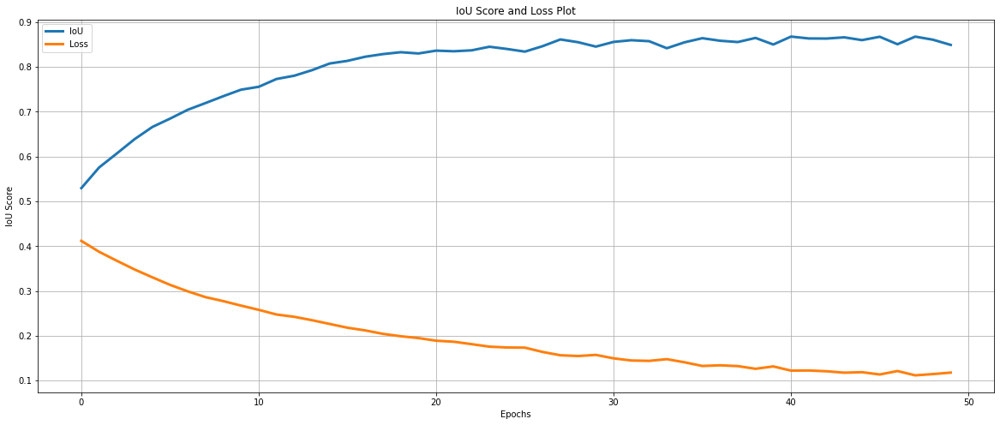

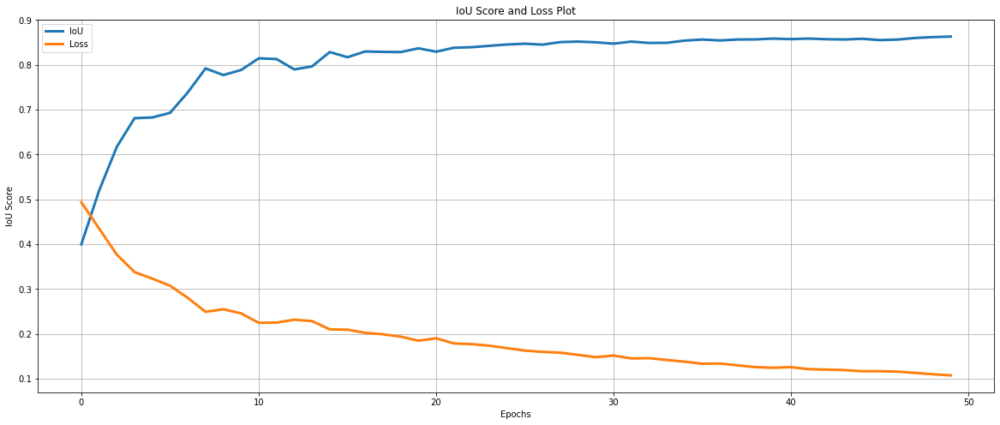

NameError: name 'predicted_mask' is not defined

In [5]:
from sklearn.metrics import roc_curve, auc # roc curve tools

#Data for 50 epochs PNG-no-aug
training_loss=[]
training_IoU=[]
validation_loss=[]
validation_IoU=[]
c = [0.4117,0.5295,0.4938,0.3999,0.3874,0.5756,0.4352,0.5196,0.3673,0.6069
,0.3769,0.6174,0.3479,0.6388,0.338,0.6812,0.3304,0.666,0.3235,0.6828,0.3135,0.6847
,0.3077,0.6931,0.299,0.7045,0.2805,0.7387,0.2861,0.7195,0.2494,0.7922,0.2772,0.7348
,0.2551,0.7774,0.2672,0.7493,0.2461,0.7886,0.2577,0.7558,0.2249,0.8147,0.2473,0.7732
,0.2254,0.8131,0.2422,0.7805,0.2318,0.79,0.2346,0.7929,0.2288,0.7966,0.2262,0.8078
,0.2103,0.8287,0.2178,0.8137,0.2096,0.8172,0.2118,0.8229,0.2026,0.83,0.2041,0.8288
,0.1993,0.8291,0.1988,0.833,0.1941,0.8287,0.1947,0.8302,0.185,0.837,0.1888,0.8365
,0.1904,0.8295,0.1865,0.8351,0.1789,0.8383,0.1811,0.8372,0.1774,0.8395,0.1755,0.8452
,0.1739,0.8426,0.1737,0.8402,0.1684,0.8455,0.1733,0.8343,0.163,0.8473,0.1637,0.8465
,0.1601,0.8452,0.1563,0.8615,0.1584,0.8509,0.1546,0.8553,0.1534,0.852,0.1571,0.8455
,0.1483,0.8504,0.1494,0.856,0.1519,0.8474,0.1446,0.8598,0.1455,0.852,0.1438,0.8576
,0.1461,0.849,0.1476,0.8419,0.142,0.8493,0.1406,0.8551,0.1383,0.8542,0.1324,0.8643
,0.1336,0.8566,0.1339,0.8586,0.1341,0.8546,0.1321,0.8557,0.13,0.8567,0.1261,0.8649
,0.1261,0.8569,0.1314,0.8502,0.1247,0.8587,0.122,0.8679,0.126,0.8575,0.1223,0.8637
,0.1216,0.8587,0.1206,0.8635,0.1206,0.8573,0.1174,0.8662,0.1196,0.8567,0.1185,0.86
,0.1169,0.8583,0.1134,0.8675,0.117,0.8554,0.1211,0.8508,0.116,0.8565,0.1115,0.8678
,0.1133,0.8601,0.1143,0.8609,0.1101,0.862,0.1176,0.8493,0.1078,0.8632]

for i in range(len(c)):
    if i%4 == 0:
        training_loss.append(c[i])
    elif i%4 == 1:
        training_IoU.append(c[i])
    elif i%4 == 2:
        validation_loss.append(c[i])
    else:
        validation_IoU.append(c[i])
        
training_loss = np.array(training_loss)
training_IoU = np.array(training_IoU)
training_IoU.T

length = list(range(50))
plt.figure(figsize=(20,8))
plt.plot(length, training_IoU, lw=3, label = 'IoU')
plt.plot(length, training_loss, lw=3, label = 'Loss')
plt.xlabel('Epochs')
plt.ylabel('IoU Score')
plt.title('IoU Score and Loss Plot')
plt.legend(loc='best')
plt.grid()
plt.savefig('iou_score_plot.png')
plt.show()

validation_loss = np.array(validation_loss)
validation_IoU = np.array(validation_IoU)
validation_IoU.T

length = list(range(50))
plt.figure(figsize=(20,8))
plt.plot(length, validation_IoU, lw=3, label = 'IoU')
plt.plot(length, validation_loss, lw=3, label = 'Loss')
plt.xlabel('Epochs')
plt.ylabel('IoU Score')
plt.title('IoU Score and Loss Plot')
plt.legend(loc='best')
plt.grid()
plt.savefig('val_score_plot.png')
plt.show()

# ROC Curve generation
predicted_labels = predicted_mask.ravel() # we want to make them into vectors
for i in range(len(ground_truth_labels)):
    if predicted_labels[i] == 255:
        predicted_labels[i] = 1

#score_value = 1-ground_truth_mask.ravel()/255.0 # we want to make them into vectors
ground_truth_labels = ground_truth_mask.ravel() # we want to make them into vectors
for i in range (len(score_value)):
    if ground_truth_labels[i] == 255:
        ground_truth_labels[i] = 1
        

fpr, tpr, _ = roc_curve(predicted_labels,ground_truth_labels)
roc_auc = auc(fpr,tpr)

fig, ax = plt.subplots(1,1)
ax.plot(fpr, tpr, label='AUC (area = %0.2f)' % roc_auc)
ax.plot([0, 1], [0, 1], 'k--')
ax.set_xlim([0.0, 1.05])
ax.set_ylim([0.0, 1.05])
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.set_title('Receiver operating characteristic example')
ax.legend(loc="lower right")

In [11]:
iou = [0.799,0.806,0.818]
f1 = [.887, 0.891, 0.899]
pre = [0.856,0.867,0.871]
re = [0.92,0.917,0.93]
oa = [0.901,0.893,0.888]
print(sum(f1)/3)

0.8923333333333333
